In [1]:
import cv2
import numpy as np
from pathlib import Path

from hloc import extract_features, match_features
from hloc.utils.io import get_matches, get_keypoints
from hloc.visualization import plot_images, plot_keypoints, plot_matches, read_image, add_text

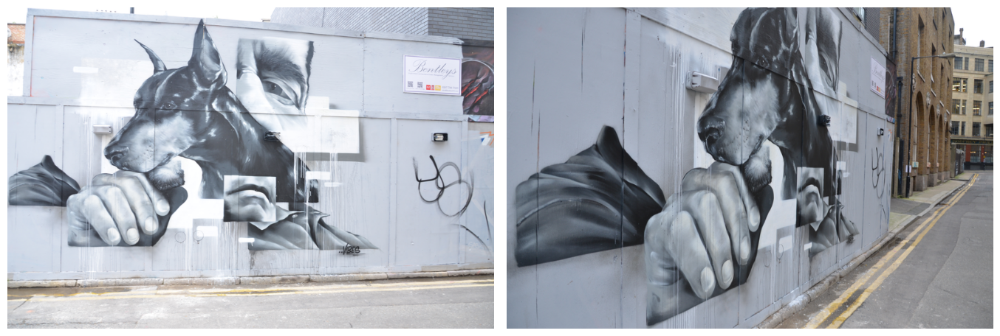

In [5]:
# image_dir = Path("../image-matching-challenge-2023/train/heritage/cyprus/images")
image_dir = Path("/root/FeatureBooster/hpatches_sequences/hpatches-sequences-release/v_dogman/")
# pair_path = os.path.join('/root/FeatureBooster/hpatches_sequences/hpatches-sequences-release/i_school/')
# pair_path = os.path.join('/root/FeatureBooster/hpatches_sequences/hpatches-sequences-release/v_dogman/')
# img1 = cv2.imread(os.path.join(pair_path, '1.ppm'))
# img2 = cv2.imread(os.path.join(pair_path, '6.ppm'))

# img_1 = "DSC_6488.JPG"
# img_2 = "DSC_6492.JPG"

img_1 = "1.ppm"
img_2 = "4.ppm"
img_list = [img_1, img_2]

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])

In [6]:
output_dir = Path("output")
output_dir.mkdir(exist_ok=True, parents=True)

pairs_path = output_dir / "pairs.txt"

# for the first round of feature extraction and matching
features_1_path = output_dir / "features_1.h5" 
matches_1_path = output_dir / "matches_1.h5"

# for the second round of feature extraction and matching
features_2_path = output_dir / "features_2.h5" 
matches_2_path = output_dir / "matches_2.h5"

# for the combination of both rounds
features_final_path = output_dir / "features_final.h5"
matches_final_path = output_dir / "matches_final.h5"

# for the cropped images
cropped_image_dir = output_dir / "cropped_images"
cropped_image_dir.mkdir(exist_ok=True, parents=True)

In [7]:
# create pairs file
with open(pairs_path, 'w') as file:
    file.write(f"{img_1} {img_2}")

In [8]:
extract_features.main(
    conf=extract_features.confs["superpoint_max"],
    image_dir=image_dir,
    image_list=img_list,
    feature_path=features_1_path,
)

match_features.main(
    conf=match_features.confs["superglue"],
    pairs=pairs_path,
    features=features_1_path,
    matches=matches_1_path,
)

[2024/05/13 10:40:45 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-rmax1600',
 'preprocessing': {'grayscale': True, 'resize_force': True, 'resize_max': 1600}}


Loaded SuperPoint model


100%|██████████| 2/2 [00:01<00:00,  1.08it/s]
[2024/05/13 10:40:48 hloc INFO] Finished exporting features.
[2024/05/13 10:40:48 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]
[2024/05/13 10:40:49 hloc INFO] Finished exporting matches.


PosixPath('output/matches_1.h5')

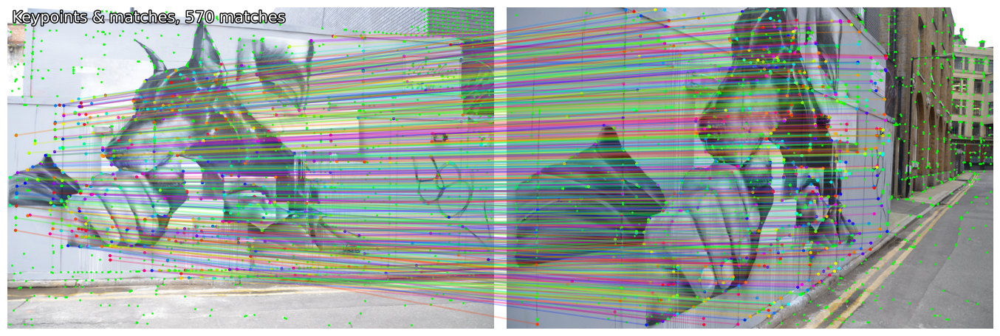

In [9]:
kp1, kp2 = get_keypoints(features_1_path, img_1), get_keypoints(features_1_path, img_2)
m, sc = get_matches(matches_1_path, img_1, img_2)

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_keypoints([kp1, kp2])
plot_matches(kp1[m[:,0]], kp2[m[:,1]], a=0.25)
add_text(0, f"Keypoints & matches, {m.shape[0]} matches")

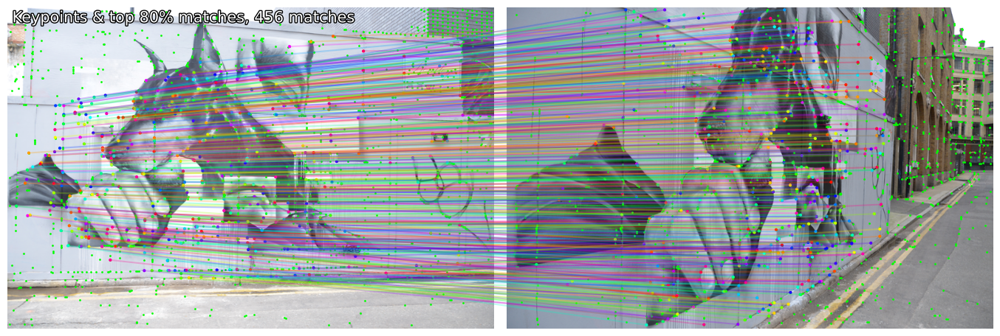

In [10]:
threshold = np.quantile(sc, 0.2)
mask = sc >= threshold
top_m = m[mask] # top 80% matches

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_keypoints([kp1, kp2])
plot_matches(kp1[top_m[:,0]], kp2[top_m[:,1]], a=0.25)
add_text(0, f"Keypoints & top 80% matches, {top_m.shape[0]} matches")

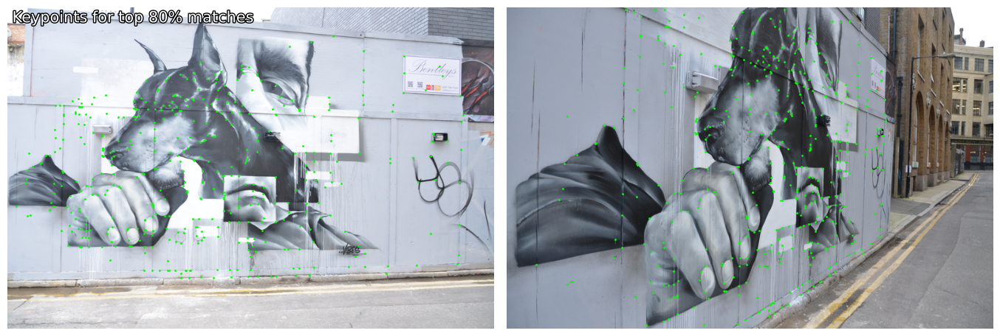

In [11]:
top_kp1 = kp1[top_m[:,0]]
top_kp2 = kp2[top_m[:,1]]

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_keypoints([top_kp1, top_kp2])
add_text(0, "Keypoints for top 80% matches")

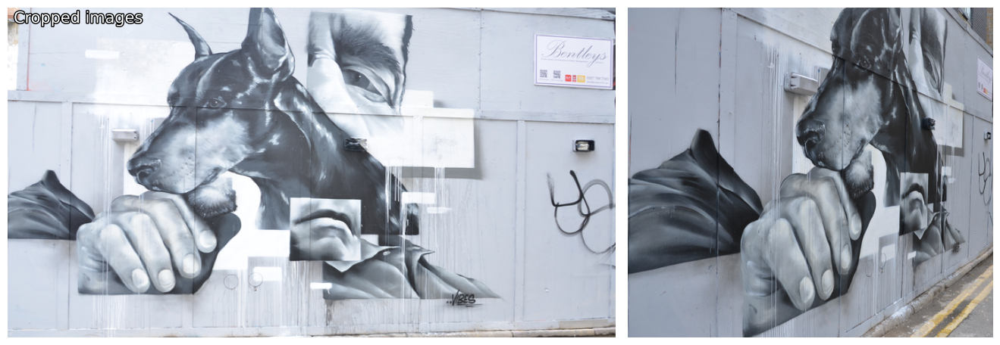

In [12]:
def crop_image(image_path, crop_path, keypoints):
    img = cv2.imread(str(image_path))
    crop = img[
        keypoints[:, 1].min() : keypoints[:, 1].max() + 1, 
        keypoints[:, 0].min() : keypoints[:, 0].max() + 1, 
    ]
    cv2.imwrite(str(crop_path), crop)

crop_image(image_dir / img_1, cropped_image_dir / img_1, top_kp1.astype(np.int32))
crop_image(image_dir / img_2, cropped_image_dir / img_2, top_kp2.astype(np.int32))

plot_images([read_image(cropped_image_dir / img_1), read_image(cropped_image_dir / img_2)])
add_text(0, "Cropped images")

In [13]:
extract_features.main(
    conf=extract_features.confs["superpoint_max"],
    image_dir=cropped_image_dir,
    image_list=img_list,
    feature_path=features_2_path,
)

match_features.main(
    conf=match_features.confs["superglue"],
    pairs=pairs_path,
    features=features_2_path,
    matches=matches_2_path,
)

match_features.main(
    conf=match_features.confs["superglue"],
    pairs=pairs_path,
    features=features_2_path,
    matches=matches_2_path,
)

[2024/05/13 10:40:52 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-rmax1600',
 'preprocessing': {'grayscale': True, 'resize_force': True, 'resize_max': 1600}}


Loaded SuperPoint model


100%|██████████| 2/2 [00:00<00:00,  6.54it/s]
[2024/05/13 10:40:52 hloc INFO] Finished exporting features.
[2024/05/13 10:40:52 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]
[2024/05/13 10:40:53 hloc INFO] Finished exporting matches.


PosixPath('output/matches_2.h5')

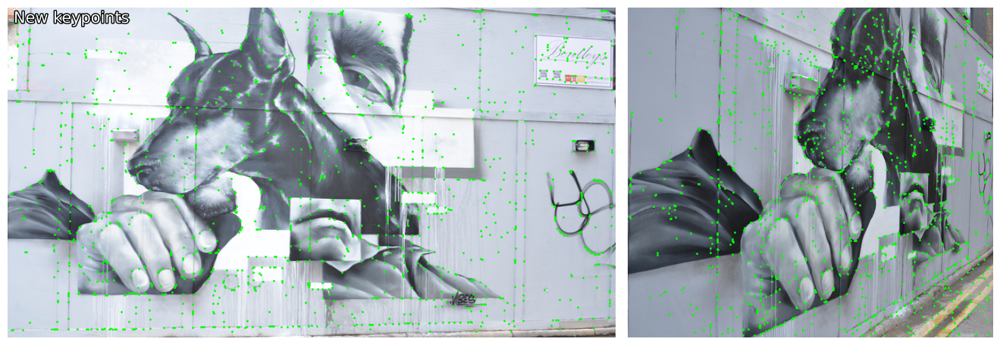

In [14]:
new_kp1, new_kp2 = get_keypoints(features_2_path, img_1), get_keypoints(features_2_path, img_2)
new_m, _ = get_matches(matches_2_path, img_1, img_2)

plot_images([read_image(cropped_image_dir / img_1), read_image(cropped_image_dir / img_2)])
plot_keypoints([new_kp1, new_kp2])
add_text(0, "New keypoints")

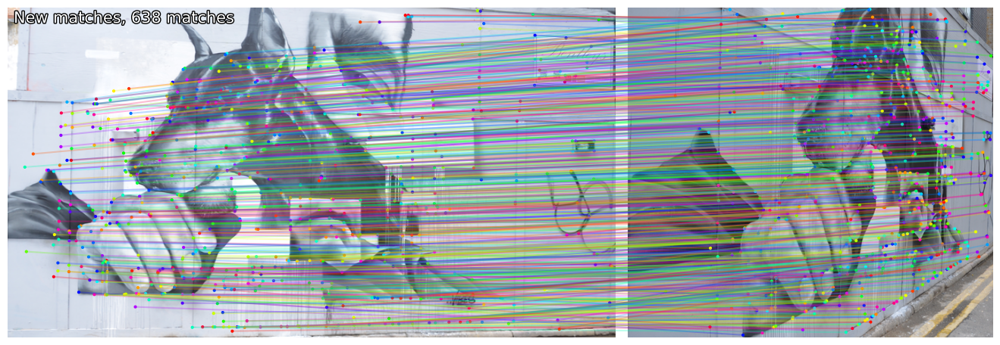

In [15]:
plot_images([read_image(cropped_image_dir / img_1), read_image(cropped_image_dir / img_2)])
plot_matches(new_kp1[new_m[:,0]], new_kp2[new_m[:,1]], a=0.25)
add_text(0, f"New matches, {new_m.shape[0]} matches")

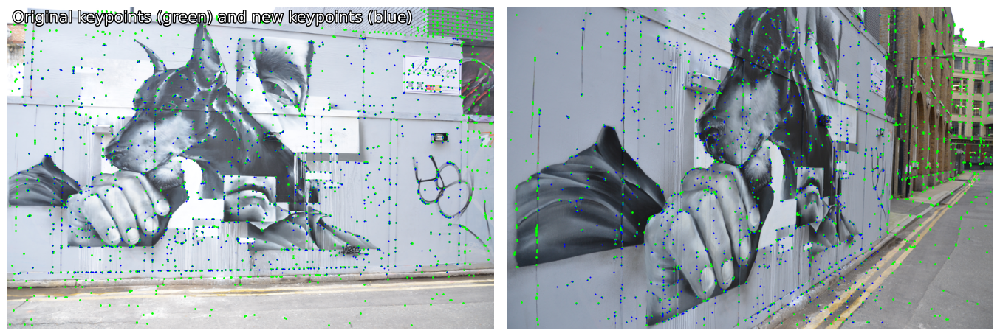

In [16]:
# move new keypoints from cropped image space to original image space
def transform_keypoints(top_keypoints, new_keypoints):
    result = np.copy(new_keypoints)
    result[:,0] += top_keypoints[:,0].min()
    result[:,1] += top_keypoints[:,1].min()
    return result

transformed_kp1 = transform_keypoints(top_kp1, new_kp1)
transformed_kp2 = transform_keypoints(top_kp2, new_kp2)

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_keypoints([kp1, kp2])
plot_keypoints([transformed_kp1, transformed_kp2], colors="blue", ps=2)
add_text(0, "Original keypoints (green) and new keypoints (blue)")

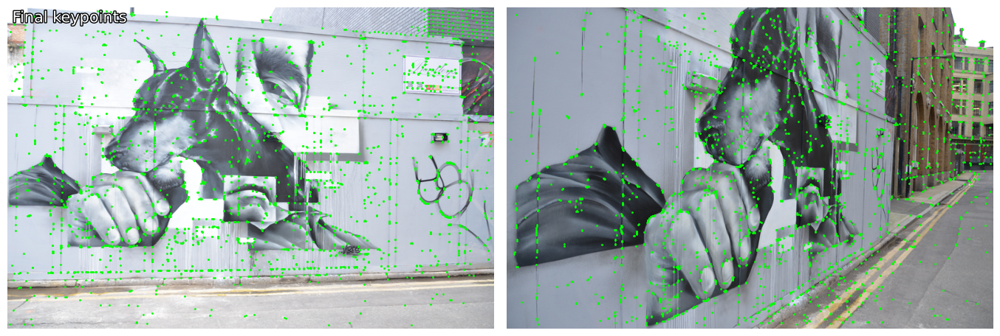

In [17]:
# need to add index offsets to the new matches!
new_m_offset = np.copy(new_m)
new_m_offset[:,0] += kp1.shape[0]
new_m_offset[:,1] += kp2.shape[0]

m_final = np.vstack((m, new_m_offset))
kp1_final = np.vstack((kp1, transformed_kp1))
kp2_final = np.vstack((kp2, transformed_kp2))

plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_keypoints([kp1_final, kp2_final])
add_text(0, "Final keypoints")

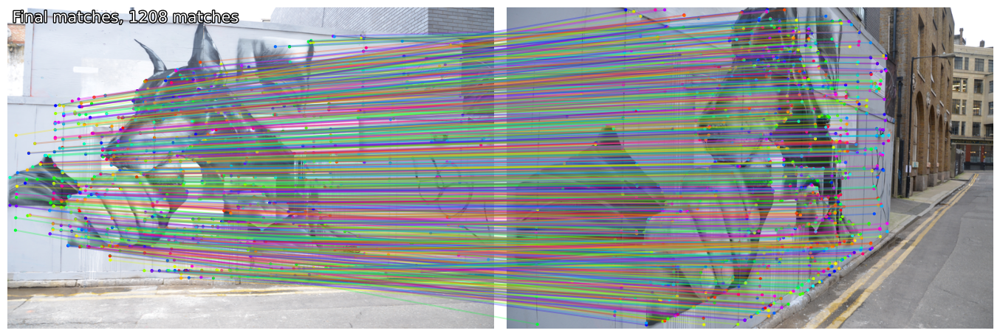

In [19]:
plot_images([read_image(image_dir / img_1), read_image(image_dir / img_2)])
plot_matches(kp1_final[m_final[:,0]], kp2_final[m_final[:,1]], a=0.25)
add_text(0, f"Final matches, {m_final.shape[0]} matches")